## 🎯 Objective

Loan prediction is a common real-life problem that banks face in their lending operations. Automating the loan approval process can save significant time and enhance the speed of service for customers.

This is a binary classification problem where I aim to predict whether a loan application will be approved or not. The dataset, sourced from Kaggle, contains information about the applicants. The target variable is Loan_Status, and we need to develop a model using the applicants' information to predict target outcome.


Let’s look at the metadata of the datasets to understand the data better:

- id : Applicant id

- person_age : Applicant age

- person_income : Annual Income

- person_home_ownership : Whether the applicant owns a home or not

- person_emp_length :  How many years the applicant has been working

- loan_intent : Reason for the loan request (e.g. MEDICAL)

- loan_grade : Credit risk rating(a score showing how reliable the applicant is in paying back loans.)

- loan_amnt : Loan amount requested 

- loan_int_rate : Interest rate assigned to requested loan (%)

- loan_percent_income : How much of the applicant's income is being spent on repaying the loan(%) 

- cb_person_default_on_file : whether the applicant has ever failed to pay back a loan

- cb_person_cred_hist_length : How long the applicant has had a credit history

- loan_status : whether the loan is approved or rejected (0=rejected , 1=approved)


## 📌 0. Import Packages

In [ ]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown
from scipy.stats import probplot
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge, SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor, ExtraTreesRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import cross_val_score
from pathlib import Path
from sklearn.metrics import mean_squared_error
from scipy import stats
from yellowbrick.model_selection import FeatureImportances
import joblib
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators import H2ORandomForestEstimator


/Users/atefeh/miniconda3/envs/tf2/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


 ## 📥 1. Data Understanding


### 1.1 Import Data

In [306]:
# Load train and test data
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')
train_df.head(3)

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0


The train set has 13 feature columns and 58,645 records, while the test set has 12 feature columns and 39,098 records. The only difference is that the test set does not include the Loan_Status column. The goal is to build a model using the train data to predict Loan_Status for the test set.

In [392]:
# Rename the features to be more readable(train data)
train_df = train_df.rename(columns={
    'person_age' : 'Age',
    'person_income':'Income',
    'person_home_ownership':'Dwelling',
    'person_emp_length':'Employment length',
    'loan_intent':'Loan reason',
    'loan_grade' : 'Credit risk rating',
    'loan_amnt':'Loan Amount requested',
    'loan_int_rate':'Interest rate',
    'loan_percent_income':'Loan-to-Income Ratio',
    'cb_person_default_on_file':'Has a default',
    'cb_person_cred_hist_length':'Credit history length',
    'loan_status':'Loan approval status'
})


In [ ]:
# Rename the features to be more readable (test data)
test_df = test_df.rename(columns={
    'person_age' : 'Age',
    'person_income':'Income',
    'person_home_ownership':'Dwelling',
    'person_emp_length':'Employment length',
    'loan_intent':'Loan reason',
    'loan_grade' : 'Credit risk rating',
    'loan_amnt':'Loan Amount requested',
    'loan_int_rate':'Interest rate',
    'loan_percent_income':'Loan-to-Income Ratio',
    'cb_person_default_on_file':'Has a default',
    'cb_person_cred_hist_length':'Credit history length'
})

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     58645 non-null  int64  
 1   Age                    58645 non-null  int64  
 2   Income                 58645 non-null  int64  
 3   Dwelling               58645 non-null  object 
 4   Employment length      58645 non-null  float64
 5   Loan reason            58645 non-null  object 
 6   Credit risk rating     58645 non-null  object 
 7   Loan Amount requested  58645 non-null  int64  
 8   Interest rate          58645 non-null  float64
 9   Loan-to-Income Ratio   58645 non-null  float64
 10  Has a default          58645 non-null  object 
 11  Credit history length  58645 non-null  int64  
 12  Loan approval status   58645 non-null  int64  
dtypes: float64(3), int64(6), object(4)
memory usage: 5.8+ MB


### 1.2 Univariate Analysis

In [ ]:
# Generate profile report for train data
profile = ProfileReport(train_df, explorative=True)


# Save report as HTML
profile.to_file("report.html")

# Display report
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

- The loan approval status data shows that out of 58,645 applications, only 8,350 (14.2%) were approved (1), while 50,295 (85.8%) were rejected (0). This indicates a low approval rate for loans.


- The majority (52.2%) of people rent their homes, while 42.3% have a mortgage, indicating a high reliance on non-ownership housing. Only 5.4% own their homes, highlighting a lower proportion of homeownership.


- The most common credit history lengths are 3 years (18.3%), 2 years (18.2%), and 4 years (18.0%), indicating that most individuals have a relatively short credit history.


-  The majority of clients (85.2%) have not defaulted, while 14.8% have defaulted. 


- The interest rate ranges from 5.42% to 23.22%, with a mean of 10.68%.

- The Credit Risk Rating categorizes individuals into 7 distinct risk levels (A to G). The most common ratings are A (35.8%) and B (34.8%), indicating lower-risk borrowers.

- 75% of clients earn up to $75,600 annually, are aged 30 or younger, have less than 7 years of work experience, and maintain a Loan-to-Income Ratio of 21% or lower.

In [ ]:
# Generate profile report for test data
profile = ProfileReport(test_df, explorative=True)

# Save report as HTML
profile.to_file("report2.html")

# Display report
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

##### 1.2.1 Quick Glance at Clients Who Approved and Rejected

In [391]:

# Divided data into class 1 and 0
train_df_class_1= train_df.loc[train_df['Loan approval status']==1]
train_df_class_0= train_df.loc[train_df['Loan approval status']==0]


# Function to highlight mean and median
def highlight_mean_median(val, col_name, desc, medians):
    color_dict_mean = {
        'Income': 'color: yellow',
        'Age': 'color: cyan',
        'Employment length': 'color: magenta',
        'Loan Amount requested': 'color: lime',
        'Interest rate': 'color: orange',
        'Loan-to-Income Ratio': 'color: violet',
        'Credit history length': 'color: red'
    }

    color_dict_median = {
        'Income': 'color: yellow',
        'Age': 'color: cyan',
        'Employment length': 'color: magenta',
        'Loan Amount requested': 'color: lime',
        'Interest rate': 'color: orange',
        'Loan-to-Income Ratio': 'color: violet',
        'Credit history length': 'color: red'
    }

    if val == desc[col_name]['mean']:
        return color_dict_mean.get(col_name, '')
    elif val == medians[col_name]:
        return color_dict_median.get(col_name, '')
    return ''

# Function to generate and style the describe() output 
def generate_styled_table(df, name):
    desc = df[['Age', 'Income', 'Employment length', 'Loan Amount requested', 
               'Interest rate', 'Loan-to-Income Ratio', 'Credit history length']].describe()
    medians = df[['Age', 'Income', 'Employment length', 'Loan Amount requested', 
                  'Interest rate', 'Loan-to-Income Ratio', 'Credit history length']].median()

    # Apply the styling using the custom function for each column
    styled_desc = desc.style.applymap(lambda val: highlight_mean_median(val, 'Age', desc, medians), subset=['Age'])
    styled_desc = styled_desc.applymap(lambda val: highlight_mean_median(val, 'Income', desc, medians), subset=['Income'])
    styled_desc = styled_desc.applymap(lambda val: highlight_mean_median(val, 'Employment length', desc, medians), subset=['Employment length'])
    styled_desc = styled_desc.applymap(lambda val: highlight_mean_median(val, 'Loan Amount requested', desc, medians), subset=['Loan Amount requested'])
    styled_desc = styled_desc.applymap(lambda val: highlight_mean_median(val, 'Interest rate', desc, medians), subset=['Interest rate'])
    styled_desc = styled_desc.applymap(lambda val: highlight_mean_median(val, 'Loan-to-Income Ratio', desc, medians), subset=['Loan-to-Income Ratio'])
    styled_desc = styled_desc.applymap(lambda val: highlight_mean_median(val, 'Credit history length', desc, medians), subset=['Credit history length'])

    # Display title for each table
    display(Markdown(f'## Descriptive Statistics for {name}'))
    
    # Display the styled DataFrame
    display(styled_desc)

# Generate and display the styled tables for both datasets
generate_styled_table(train_df_class_1, "Class 1 (Approved Clients)")
generate_styled_table(train_df_class_0, "Class 0 (Rejected Clients)")


## Descriptive Statistics for Class 1 (Approved Clients)

,Age,Income,Employment length,Loan Amount requested,Interest rate,Loan-to-Income Ratio,Credit history length
count,8350.000000,8350.000000,8350.000000,8350.000000,8350.000000,8350.000000,8350.000000
mean,27.534132,48224.661796,3.725030,11197.271856,13.202305,0.244363,5.783593
std,6.344539,22435.665380,3.887733,6468.214784,3.018438,0.118654,4.189715
min,20.000000,9600.000000,0.000000,1000.000000,5.420000,0.010000,2.000000
25%,23.000000,32000.000000,1.000000,6000.000000,11.112500,0.140000,3.000000
50%,26.000000,44000.000000,3.000000,10000.000000,13.790000,0.250000,4.000000
75%,30.000000,59000.000000,6.000000,15000.000000,15.580000,0.330000,8.000000
max,80.000000,397800.000000,123.000000,35000.000000,23.220000,0.830000,30.000000


## Descriptive Statistics for Class 0 (Rejected Clients)

,Age,Income,Employment length,Loan Amount requested,Interest rate,Loan-to-Income Ratio,Credit history length
count,50295.000000,50295.000000,50295.000000,50295.000000,50295.000000,50295.000000,50295.000000
mean,27.553634,66672.867720,4.863048,8888.883229,10.258767,0.145105,5.818531
std,5.980022,39314.378848,3.948375,5328.359771,2.827052,0.077867,4.001945
min,20.000000,4200.000000,0.000000,500.000000,5.420000,0.000000,2.000000
25%,23.000000,45000.000000,2.000000,5000.000000,7.510000,0.080000,3.000000
50%,26.000000,60000.000000,4.000000,8000.000000,10.390000,0.130000,4.000000
75%,30.000000,80000.000000,7.000000,12000.000000,12.420000,0.200000,8.000000
max,123.000000,1900000.000000,123.000000,35000.000000,22.110000,0.630000,30.000000


- Rejected clients tend to have significantly higher incomes,and a longer employment history.

- Approved clients request higher loan amounts with higher interest rates.

### 1.3 Bivariate analysis


#### 1.3.1 Numerical vs categorical features



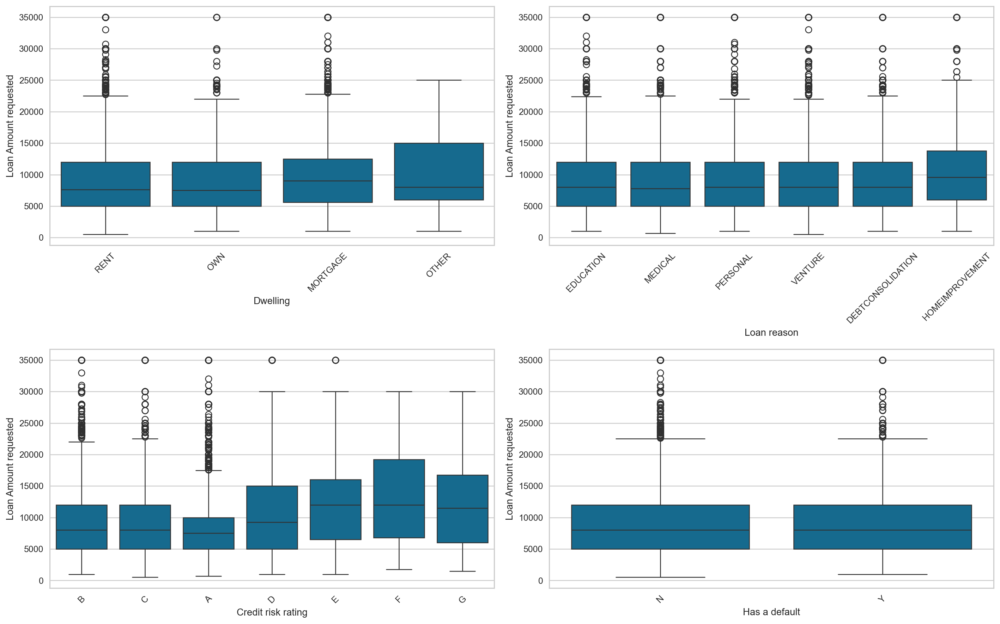

In [4]:
# Selecting categoriacal features
categorical_col = train_df.select_dtypes(include='O').columns

# Compare Loan Amount requested across different categorical features
fig , ax = plt.subplots(2,2,figsize =(16,10),dpi=180) 
ax = ax.flatten()  
for index , col in enumerate(categorical_col):
    sns.boxplot(x=train_df[col] , y=train_df['Loan Amount requested'],ax=ax[index]) # box-plot
    ax[index].set_xlabel(col)
    ax[index].set_ylabel('Loan Amount requested')
    ax[index].tick_params(axis='x', rotation=45, labelsize=10)
plt.tight_layout() 
plt.show() 

##### 📍 Individuals applying for "home improvement" loans slightly request higher amounts, and those with higher credit risk tend to seek larger loan amounts.

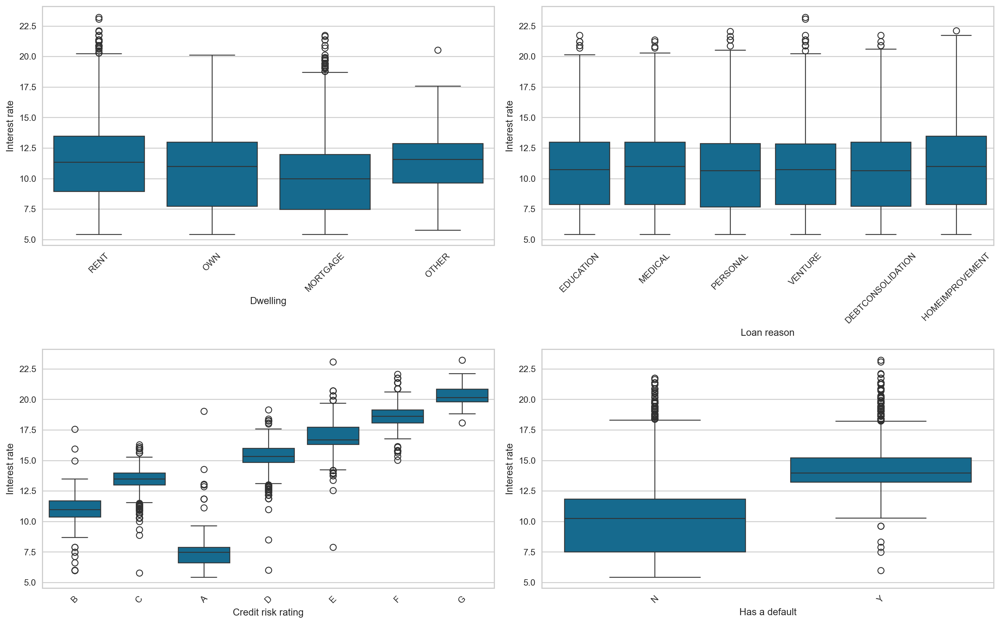

In [5]:
# Compare Interest rate across different categorical features

fig , ax = plt.subplots(2,2,figsize =(16,10),dpi=180) 
ax = ax.flatten()  
for index , col in enumerate(categorical_col):
    sns.boxplot(x=train_df[col] , y=train_df['Interest rate'],ax=ax[index])
    ax[index].set_xlabel(col)
    ax[index].set_ylabel('Interest rate')
    ax[index].tick_params(axis='x', rotation=45, labelsize=10)
plt.tight_layout()  
plt.show() 

##### 📍Applicants who have defaulted on a loan tend to face higher interest rates. Also, the credit risk rating shows that individuals with higher risk credits face higher interest rates.

##### 1.3.2 Correlation analysis

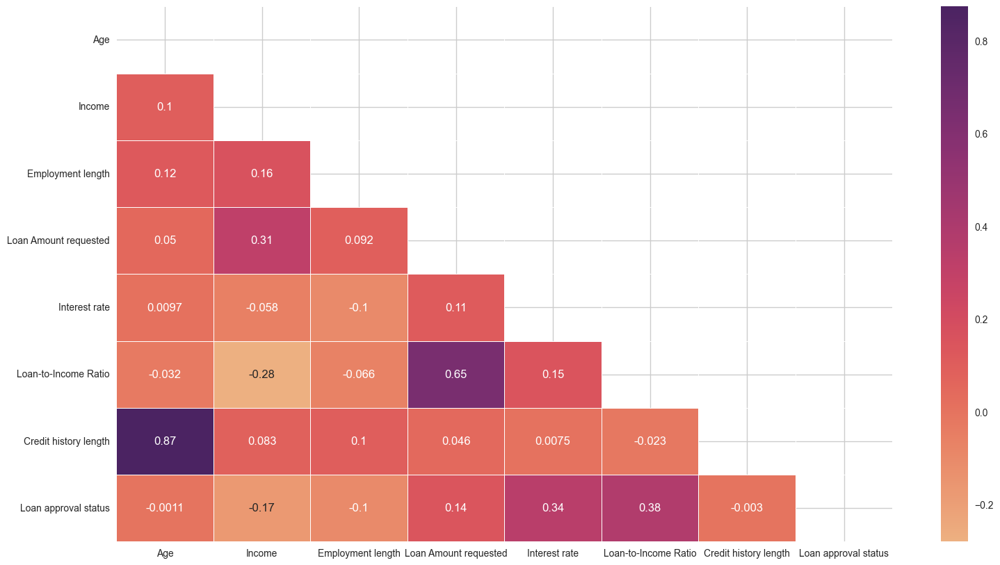

In [ ]:
# Calculate Correaltion
train_df_corr = train_df[['Age','Income','Employment length','Loan Amount requested',
                                  'Interest rate','Loan-to-Income Ratio','Credit history length','Loan approval status']].corr()

mask = np.zeros_like(train_df_corr, dtype='bool')
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(18,10))
# seaborn heatmap
sns.heatmap(train_df_corr, annot=True, cmap='flare',mask=mask, linewidths=.5)
# plot the heatmap
plt.show()

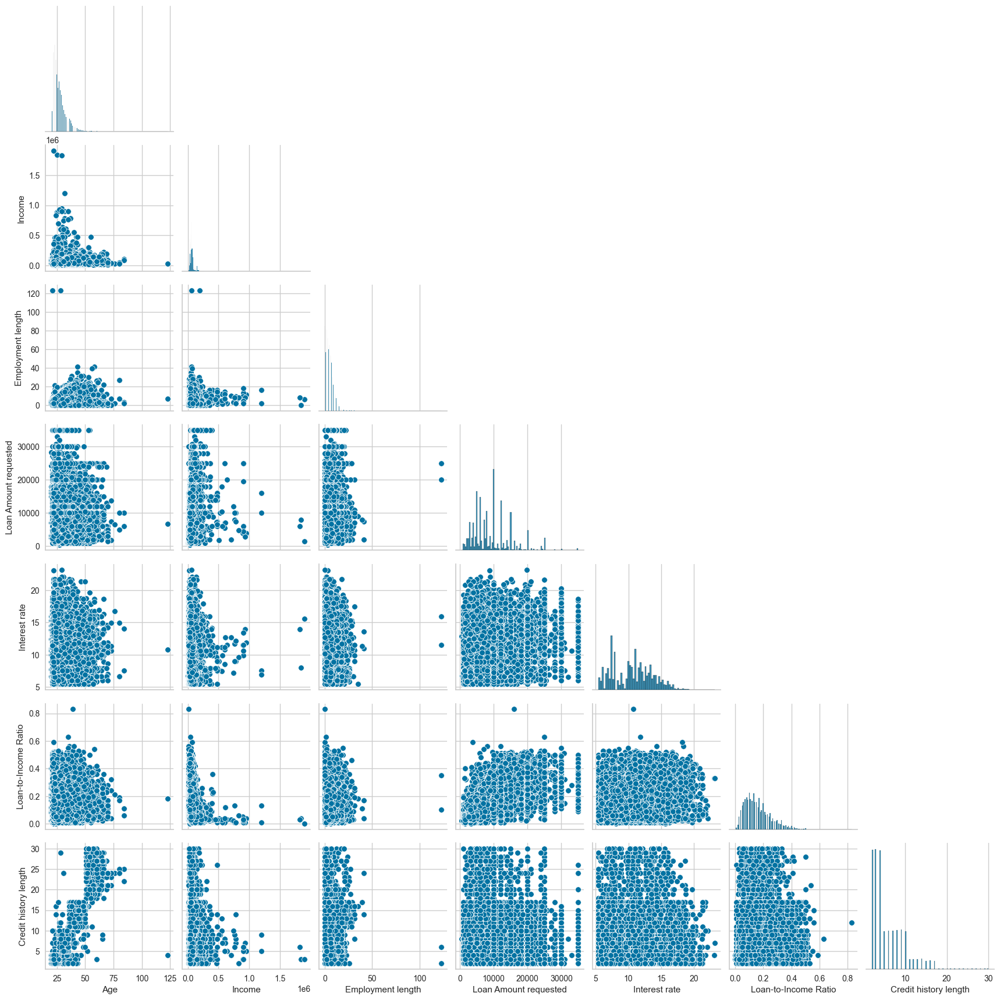

In [ ]:
# Pair-Plot between numerical features
sns.pairplot( train_df[['Age','Income','Employment length','Loan Amount requested',
                                  'Interest rate','Loan-to-Income Ratio','Credit history length']],corner=True)


##### 1️⃣ The strongest relationship is found between credit history length and age, which is expected as it needs more time to build a strong credit history.



##### 2️⃣ According to the heatmap, income has a negative correlation with loan approval, suggesting approval might depend more on other financial factors like credit risk.




#### 1.3.3 Features vs Target Variable

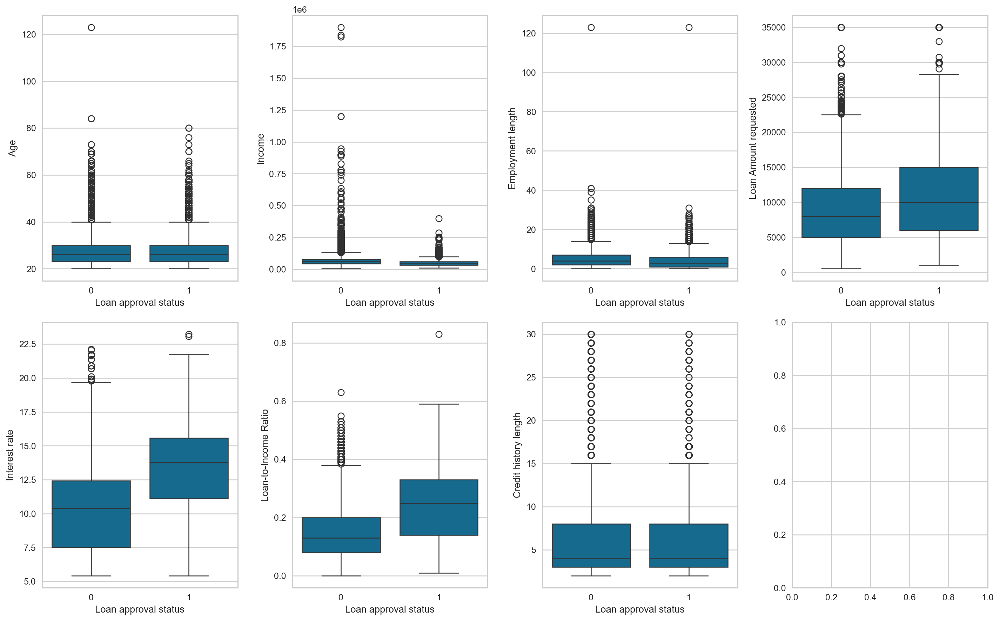

In [ ]:
# Select numerical features
num_features = train_df.select_dtypes(exclude='O').columns.drop(['id','Loan approval status'])

# Checking how different numerical columns are associated with loan approval outcomes.

fig , ax = plt.subplots(2,4,figsize =(16,10),dpi=180) 
ax = ax.flatten()  
for index , col in enumerate(num_features):
    sns.boxplot(x=train_df['Loan approval status'] , y=train_df[col],ax=ax[index])
    ax[index].set_xlabel('Loan approval status')
    ax[index].set_ylabel(col)
plt.tight_layout()  
plt.show() 

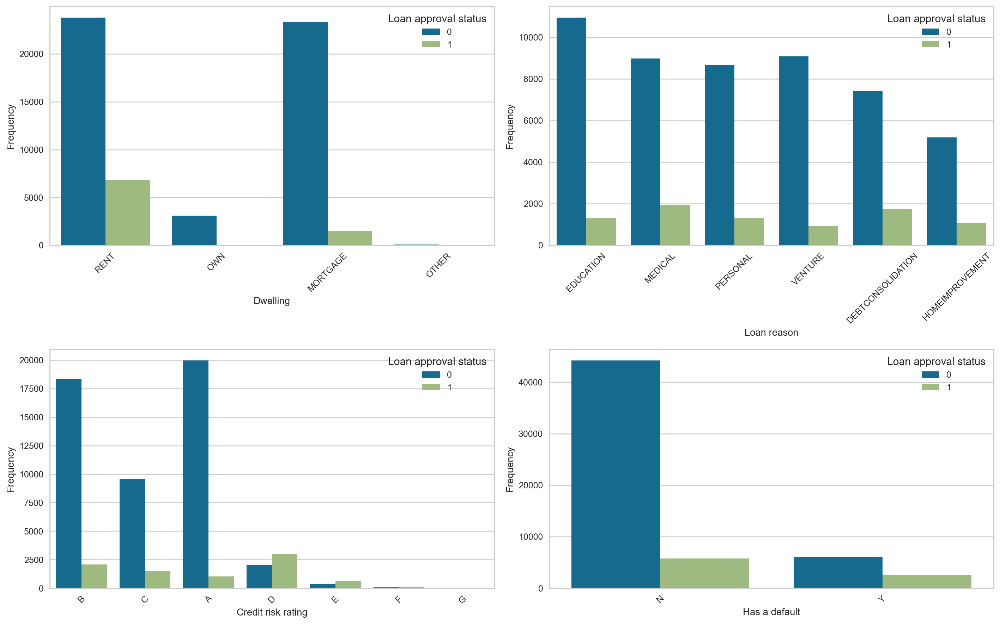

In [ ]:
# Checking how different categories are associated with loan approval outcomes.

fig , ax = plt.subplots(2,2,figsize =(16,10),dpi=180) # Create a 2x2 grid of subplots
ax = ax.flatten()  
for index , col in enumerate(categorical_col): # Loop through each categorical column
    sns.countplot(data=train_df, x=col, hue='Loan approval status',ax=ax[index]) # Create a countplot for each categorical column based on 'Loan approval status'
    ax[index].set_xlabel(col)
    ax[index].set_ylabel('Frequency')
    ax[index].tick_params(axis='x', rotation=45, labelsize=10)
plt.tight_layout()  
plt.show() 

##### 📊 According to the two above panels, we can say that:

##### 📍 Approved individuals typically tends to have higher risk score, requesting higher loan amounts, resulting in higher charged interest rates. Loan providers appear to mitigate the risk by increasing interest rates. 


##### 📍 Rejected applicants tend to include a higher proportion of individuals with extremely high incomes. Despite many of them having excellent (A) or good (B) credit risk ratings, they are still rejected.


In [312]:
# Understanding trends in credit risk

grouped_df = train_df.groupby('Credit risk rating').agg({
    'Age':'mean',
    'Income':'mean',
    'Employment length':'mean',
    'Loan Amount requested':'mean',
    'Interest rate':'mean',
    'Loan-to-Income Ratio':'mean',
    'Credit history length':'mean'
})

# Function to highlight increasing values in red
def highlight_increasing(s):
    norm = (s - s.min()) / (s.max() - s.min())  # Normalize values between 0 and 1
    return [f'background-color: rgba(255, 0, 0, {val})' for val in norm]  

# Apply styling to specific columns
styled_df = grouped_df.style.apply(highlight_increasing, subset=['Loan Amount requested', 'Interest rate'])
styled_df

,Age,Income,Employment length,Loan Amount requested,Interest rate,Loan-to-Income Ratio,Credit history length
Credit risk rating,,,,,,,
A,27.494520,66154.376001,5.194767,8447.103746,7.335176,0.143303,5.788410
B,27.508382,64859.850735,4.625490,9622.485637,11.034733,0.163879,5.771912
C,27.564426,61150.680953,4.111182,9009.894889,13.510343,0.162014,5.877945
D,27.789829,58840.785658,4.358760,10521.468017,15.404599,0.187883,5.882400
E,27.986125,62265.151635,4.213082,12176.313181,16.930961,0.209415,5.999009
F,29.114094,61029.442953,4.442953,12833.892617,18.610940,0.230872,6.637584
G,28.272727,50941.575758,2.969697,12559.090909,20.327576,0.265758,6.121212


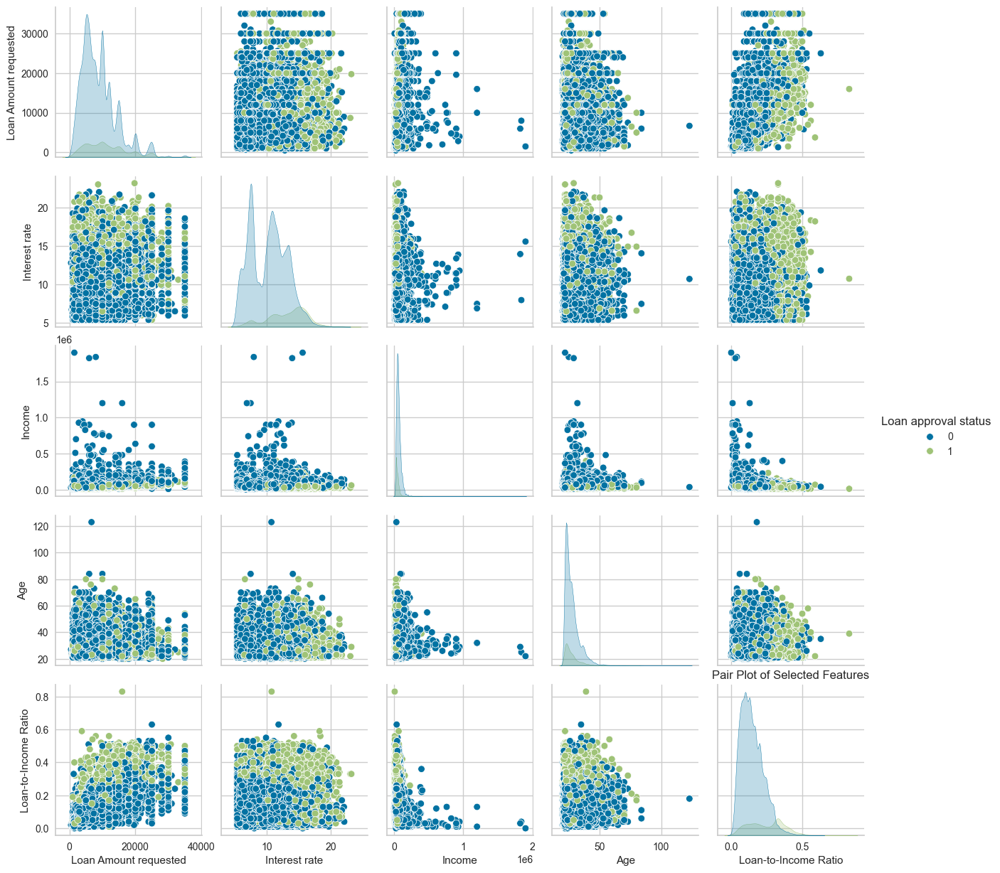

In [309]:
sns.pairplot(train_df[['Loan Amount requested', 'Interest rate', 'Income', 'Age','Loan-to-Income Ratio' ,'Loan approval status']], hue='Loan approval status')
plt.title('Pair Plot of Selected Features')
plt.show()

 ## 🛠️ 2. Data Preparation


Using EDA part, here is a list of all the transformations that need to be done on each feature:

1. Feature drop:     
- ID


2. One hot encoding:
- Dwelling
- Loan reason
- Credit risk rating(Combining E,F,G levels as one category (frequency less than 5%) )
- Has a default 


3. Fix Outliers(IQR) :
- Age
- Income
- Employment length
- Loan Amount requested
- Interest rate
- Loan-to-Income Ratio
- Credit history length


4. Normalization(min_max) : 
- Age
- Income
- Employment length
- Loan Amount requested
- Interest rate
- Loan-to-Income Ratio
- Credit history length


5. Fix skewness(log transformation):
- Age
- Income
- Employment length


6. Balance the data with SMOTE:
- Loan approval status 

##### 2.1 One hot encoding

In [53]:
class OnehotEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, one_hot_enc_ft=None):
        if one_hot_enc_ft is None:
            one_hot_enc_ft = ['Dwelling', 'Loan reason', 'Credit risk rating', 'Has a default']
        self.one_hot_enc_ft = one_hot_enc_ft

    def fit(self, df, y=None):
        return self

    def transform(self, df):
        # Check if all features for one-hot encoding are present in the DataFrame
        if not set(self.one_hot_enc_ft).issubset(df.columns):
            raise ValueError("One or more features are not in the dataframe")
        
        # One-hot encode the specified features
        encoder = OneHotEncoder()
        one_hot_encoded = encoder.fit_transform(df[self.one_hot_enc_ft])
        feat_names_one_hot_enc = encoder.get_feature_names_out(self.one_hot_enc_ft)
        
        # Create a DataFrame for the one-hot encoded features
        one_hot_enc_df = pd.DataFrame(one_hot_encoded.toarray(), columns=feat_names_one_hot_enc, index=df.index)
        
        # Drop the original one-hot encoded columns and concatenate with the rest
        df_remaining = df.drop(columns=self.one_hot_enc_ft)
        df_concat = pd.concat([one_hot_enc_df, df_remaining], axis=1)
        
        return df_concat

##### 2.2 Fix Outlier 

In [54]:
# Outliers handler

class OutlierImputer(BaseEstimator, TransformerMixin):
    def __init__(self,feat_with_outliers = ['Age', 'Income', 'Employment length', 'Loan Amount requested', 'Interest rate', 'Loan-to-Income Ratio','Credit history length']):
        self.feat_with_outliers = feat_with_outliers
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.feat_with_outliers).issubset(df.columns)):
            Q1 = df[self.feat_with_outliers].quantile(.25)
            Q3 = df[self.feat_with_outliers].quantile(.75)
            IQR = Q3 - Q1
            # keep the data within 3 IQR
            df = df[~((df[self.feat_with_outliers] < (Q1 - 1.5 * IQR)) | (df[self.feat_with_outliers] > (Q3 + 1.5 * IQR))).any(axis=1)]
            return df
        else:
            print("One or more features are not in the dataframe Outliers")
            return df

##### 2.3 Normalization

In [ ]:
class Normalizer(BaseEstimator,TransformerMixin):
    def __init__(self,normalizer_feature=['Age', 'Income', 'Employment length', 'Loan Amount requested', 'Interest rate', 'Loan-to-Income Ratio','Credit history length']):
        self.normalizer_feature=normalizer_feature

    def fit(self,df):
        return self

    def transform(self,df):
        if(set(self.normalizer_feature).issubset(df.columns)):
            min_max = MinMaxScaler()
            df[self.normalizer_feature]= min_max.fit_transform(df[self.normalizer_feature]) # Applied to all selected features to scale them
            return df
        else:
            print("One or more features are not in the dataframe for normalization")
            return df

##### 2.4 Fix skewness

In [ ]:
# Fix skewness
class SkewnessHandler(BaseEstimator, TransformerMixin):
    def __init__(self,col_with_skewness=['Age','Income','Employment length']):
        self.col_with_skewness = col_with_skewness
    def fit(self,df):
        return self
    def transform(self,df):
        if (set(self.col_with_skewness).issubset(df.columns)):
            # Handle skewness with log transformation
            df[self.col_with_skewness] = np.log1p(df[self.col_with_skewness])# log(1 + x) transformation
            return df
        else:
            print('One or more skewed columns are not found for skewness')
            return df

In [58]:
#  Credit risk rating(Combining E,F,G levels as one category (frequency less than 5%) )

# Calculate value counts as percentages
value_counts = train_df['Credit risk rating'].value_counts(normalize=True)*100

# Replace categories with frequencies < threshold with 'Other'
train_df['Credit risk rating'] = train_df['Credit risk rating'].apply(lambda x: x if value_counts[x] >= 5.0 else 'E')

In [63]:
def data_preprocessing_pipeline(df):
    pipeline = Pipeline([
        ('outlier remover', OutlierImputer()),
        ('skewness handler', SkewnessHandler()),
        ('min max scaler', Normalizer()),
        ('one hot encoder', OnehotEncoder())
    ])
    df_pipe_prep = pipeline.fit_transform(df)
    return df_pipe_prep

In [65]:
#  pass in the training dataset to data_preprocessing_pipeline 
pd.set_option('display.max_columns', None) # show all of columns
train_df_prep = data_preprocessing_pipeline(train_df)
train_df_prep.head(3)

,Dwelling_MORTGAGE,Dwelling_OTHER,Dwelling_OWN,Dwelling_RENT,Loan reason_DEBTCONSOLIDATION,Loan reason_EDUCATION,Loan reason_HOMEIMPROVEMENT,Loan reason_MEDICAL,Loan reason_PERSONAL,Loan reason_VENTURE,Credit risk rating_A,Credit risk rating_B,Credit risk rating_C,Credit risk rating_D,Credit risk rating_E,Has a default_N,Has a default_Y,id,Age,Income,Employment length,Loan Amount requested,Interest rate,Loan-to-Income Ratio,Credit history length,Loan approval status
0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0.886427,0.623368,0.000000,0.250000,0.399342,0.435897,0.923077,0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,0.135972,0.761562,0.718565,0.159091,0.521711,0.179487,0.000000,0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,2,0.533107,0.566041,0.811368,0.250000,0.228947,0.538462,0.615385,0


In [78]:
# 6. Balance the data with SMOTE: Target column --> Loan approval status 
oversample = SMOTE(sampling_strategy='minority', random_state=42)
new_feature_set, new_target_labels = oversample.fit_resample(train_df_prep.drop(columns=['Loan approval status']), train_df_prep['Loan approval status'])
df_balance = pd.concat([pd.DataFrame(new_feature_set, columns=train_df_prep.drop(columns=['Loan approval status']).columns), 
                            pd.DataFrame(new_target_labels, columns=['Loan approval status'])], axis=1)

df_balance.shape

(86934, 26)

In [99]:
df_balance = df_balance.drop(['id'],axis=1)

 ## 📈 3. Modeling


In [ ]:
# split the data into train and validation 

def data_split(data):
    new_train , new_test = train_test_split(data, test_size=0.2,random_state=42)
    return  new_train.reset_index(drop=True),new_test.reset_index(drop=True)

df_balance_train, df_balance_test = data_split(df_balance)


In [ ]:
X_train , Y_train = df_balance_train.loc[:,df_balance_train.columns != 'Loan approval status'],df_balance_train['Loan approval status']


In [178]:
# Initialize the H2O cluster
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: java version "22.0.1" 2024-04-16; Java(TM) SE Runtime Environment (build 22.0.1+8-16); Java HotSpot(TM) 64-Bit Server VM (build 22.0.1+8-16, mixed mode, sharing)
  Starting server from /Users/atefeh/miniconda3/envs/tf2/lib/python3.11/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/76/1yzscp4d71l1rljcgf5sbbfm0000gn/T/tmpe5y793cg
  JVM stdout: /var/folders/76/1yzscp4d71l1rljcgf5sbbfm0000gn/T/tmpe5y793cg/h2o_atefeh_started_from_python.out
  JVM stderr: /var/folders/76/1yzscp4d71l1rljcgf5sbbfm0000gn/T/tmpe5y793cg/h2o_atefeh_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.
Please download and install the latest version from: https://h2o-release.s3.amazonaws.com/h2o/latest_stable.html


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,America/Edmonton
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.6
H2O_cluster_version_age:,4 months and 11 days
H2O_cluster_name:,H2O_from_python_atefeh_v4uhrd
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.983 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [ ]:
h2o.connect()

Connecting to H2O server at http://localhost:54321 ... successful.
Please download and install the latest version from: https://h2o-release.s3.amazonaws.com/h2o/latest_stable.html


H2O_cluster_uptime:,21 secs
H2O_cluster_timezone:,America/Edmonton
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.6
H2O_cluster_version_age:,4 months and 11 days
H2O_cluster_name:,H2O_from_python_atefeh_v4uhrd
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.979 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


<H2OConnection to http://localhost:54321, no session>

In [ ]:
# Set up H2O AutoML and train the model

train_h2o = h2o.H2OFrame(train_df_prep)
train_h2o['Loan approval status'] = train_h2o['Loan approval status'].asfactor()

aml = H2OAutoML(max_models=5, seed=1, balance_classes=True)
aml.train(y='Loan approval status', training_frame=train_h2o)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
17:19:49.513: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/5
# GBM base models (used / total),3/3
# DRF base models (used / total),0/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None
Custom metalearner hyperparameters,None


In [ ]:
# Get the best model 
best_model = aml.leader


 ## 🔍 4. Evaluation


In [ ]:
#  pass in the test dataset to data_preprocessing_pipeline 
test_df_prep = data_preprocessing_pipeline(test_df)
test_df_prep.set_index('id', inplace=True)

# Make predictions using the best model 
test_h2o = h2o.H2OFrame(test_df_prep)

predictions = aml.predict(test_h2o)


# Convert H2OFrame to pandas dataframe 
predictions_df = predictions.as_data_frame()
predictions_df['id'] = test_df_prep.index



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [217]:
predictions_df

,predict,p0,p1,id
0,0,0.988656,0.011344,58646
1,1,0.284583,0.715417,58647
2,0,0.981693,0.018307,58648
3,0,0.924472,0.075528,58649
4,1,0.086850,0.913150,58650
...,...,...,...,...
33304,1,0.133429,0.866571,97735
33305,0,0.972547,0.027453,97736
33306,0,0.957413,0.042587,97738
33307,0,0.990924,0.009076,97739


##### Final Table

In [220]:
# Merge predictions with the original test data on the 'id' column
result_df = pd.merge(test_df, predictions_df[['id', 'predict']], on='id', how='inner')
result_df

,id,Age,Income,Dwelling,Employment length,Loan reason,Credit risk rating,Loan Amount requested,Interest rate,Loan-to-Income Ratio,Has a default,Credit history length,predict
0,58646,26,96000,MORTGAGE,6.0,PERSONAL,C,10000,12.68,0.10,Y,4,0
1,58647,26,30000,RENT,5.0,VENTURE,E,4000,17.19,0.13,Y,2,1
2,58648,33,50000,RENT,4.0,DEBTCONSOLIDATION,A,7000,8.90,0.14,N,7,0
3,58649,26,102000,MORTGAGE,8.0,HOMEIMPROVEMENT,D,15000,16.32,0.15,Y,4,0
4,58650,23,66000,RENT,5.0,EDUCATION,D,22000,14.09,0.33,N,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33304,97735,36,49000,RENT,4.0,VENTURE,C,16750,13.98,0.33,N,15,1
33305,97736,25,68000,MORTGAGE,2.0,PERSONAL,B,2800,10.99,0.04,N,2,0
33306,97738,22,31200,MORTGAGE,2.0,DEBTCONSOLIDATION,B,3000,10.37,0.10,N,4,0
33307,97739,22,48000,MORTGAGE,6.0,EDUCATION,A,7000,6.03,0.15,N,3,0


- The best model used for this project: Stacked Ensemble
- Metrics used: area under the ROC curve(auc) {According to Kaggle competition priorities.}
1. AUC = 0.95  
2. pr_auc = 0.85
